In [1]:
from IPython import display

import numpy as np
from sklearn.datasets import fetch_openml
import matplotlib.pyplot as plt

# Download MNIST dataset
X_mnist, y = fetch_openml('mnist_784', version=1, return_X_y=True, as_frame=False)
# Normalize data
X_mnist = X_mnist / 255.0



In [2]:
# X_mnist = X_mnist[y == '1'] # test only for ones and discard other digits
X_mnist.shape

(70000, 784)

## Generating MNIST digits with a GAN

// may require further training
TODO: calculate the k-NN accuracy for the GAN

In [3]:
# X_mnist = X_mnist[y == '1'] # test only for ones and discard other digits


In [23]:
from torch.autograd.variable import Variable
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torch
import torch.nn as nn
import torch.optim as optim

In [48]:
class Generator(nn.Module):
    def __init__(self, input_size, output_size):
        super(Generator, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_size, 256),
            nn.LeakyReLU(0.2),

            # nn.Linear(256, 256),
            # nn.LeakyReLU(0.2),

            nn.Linear(256, output_size),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        for l in self.layers:
            x = l(x)
        return x

In [49]:
class Discriminator(nn.Module):
    def __init__(self, input_size):
        super(Discriminator, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_size, 256),
            nn.LeakyReLU(0.2),

            # nn.Linear(256, 256),
            # nn.LeakyReLU(0.2),

            nn.Linear(256, 1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        for l in self.layers:
            x = l(x)
        return x

In [68]:
# Define the hyperparameters
input_size = 10 # this may be a bottleneck when generating more than 1 digit, TODO: test increasing to 100
output_size = 784
batch_size = 64
num_epochs = 100

# Load the MNIST dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize((0.5,), (0.5,)) # not needed I guess (the digits are actually normalised above)?
])
mnist_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
dataloader = DataLoader(mnist_dataset, batch_size=batch_size, shuffle=True)

# Create the generator and discriminator models
generator = Generator(input_size, output_size)
discriminator = Discriminator(output_size)

# Define the loss function and optimizers
criterion = nn.BCELoss()
generator_optimizer = optim.Adam(generator.parameters(), lr=0.0002)
discriminator_optimizer = optim.Adam(discriminator.parameters(), lr=0.00002)


In [69]:
discriminator

Discriminator(
  (layers): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=1, bias=True)
    (3): Sigmoid()
  )
)

In [70]:
generator

Generator(
  (layers): Sequential(
    (0): Linear(in_features=10, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=784, bias=True)
    (3): Sigmoid()
  )
)

In [71]:
# Training loop

for epoch in range(num_epochs):
    try:
        for batch_idx, (real_images, _) in enumerate(dataloader):
            batch_size = real_images.size(0)
            
            # Train the discriminator
            discriminator.zero_grad()
            real_images = real_images.view(batch_size, -1)
            real_labels = torch.ones(batch_size, 1)
            fake_labels = torch.zeros(batch_size, 1)
            
            # Generate fake images
            z = Variable(torch.randn(batch_size, input_size))
            fake_images = generator(z)
            
            # Train the discriminator on real and fake images
            real_outputs = discriminator(real_images)
            fake_outputs = discriminator(fake_images.detach())
            
            # Calculate the discriminator loss
            real_loss = criterion(real_outputs, real_labels)
            fake_loss = criterion(fake_outputs, fake_labels)
            discriminator_loss = real_loss + fake_loss
            
            # Update the discriminator weights
            discriminator_loss.backward()
            discriminator_optimizer.step()
            
            # Train the generator
            generator.zero_grad()
            z = Variable(torch.randn(batch_size, input_size))
            fake_images = generator(z)
            outputs = discriminator(fake_images)
            
            # Calculate the generator loss
            generator_loss = criterion(outputs, real_labels)
            
            # Update the generator weights
            generator_loss.backward()
            generator_optimizer.step()
            
            # Print the loss every 100 batches
            if (batch_idx + 1) % 100 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(dataloader)}], "
                    f"Discriminator Loss: {discriminator_loss.item():.4f}, "
                    f"Generator Loss: {generator_loss.item():.4f}")
    except KeyboardInterrupt:
        break


Epoch [1/100], Batch [100/938], Discriminator Loss: 1.0025, Generator Loss: 1.2489
Epoch [1/100], Batch [200/938], Discriminator Loss: 0.9065, Generator Loss: 1.2386
Epoch [1/100], Batch [300/938], Discriminator Loss: 1.1243, Generator Loss: 1.1055
Epoch [1/100], Batch [400/938], Discriminator Loss: 1.2738, Generator Loss: 1.0070
Epoch [1/100], Batch [500/938], Discriminator Loss: 1.2811, Generator Loss: 0.9231
Epoch [1/100], Batch [600/938], Discriminator Loss: 1.2288, Generator Loss: 0.8977
Epoch [1/100], Batch [700/938], Discriminator Loss: 1.3034, Generator Loss: 0.8074
Epoch [1/100], Batch [800/938], Discriminator Loss: 1.3488, Generator Loss: 0.7979
Epoch [1/100], Batch [900/938], Discriminator Loss: 1.2899, Generator Loss: 0.8210
Epoch [2/100], Batch [100/938], Discriminator Loss: 1.3129, Generator Loss: 0.7211
Epoch [2/100], Batch [200/938], Discriminator Loss: 1.2996, Generator Loss: 0.7132
Epoch [2/100], Batch [300/938], Discriminator Loss: 1.3235, Generator Loss: 0.7167
Epoc

In [72]:
# Generate some sample images
num_samples = 10
z = Variable(torch.randn(num_samples, input_size))
generated_images = generator(z)

In [73]:
import matplotlib.pyplot as plt

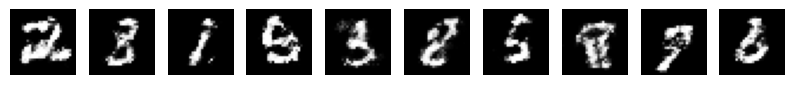

In [74]:
# Reshape the generated images to 28x28
generated_images = generated_images.view(-1, 28, 28)

# Plot the generated images
fig, axes = plt.subplots(1, num_samples, figsize=(num_samples, 2))
for i in range(num_samples):
    axes[i].imshow(generated_images[i].detach().numpy(), cmap='gray')
    axes[i].axis('off')
plt.show()


## Generating MNIDT digits based on SOM representation

### SOM (miniSOM lib, 2d lattice)

In [4]:
from minisom import MiniSom

In [5]:
def plot_som_centroids(som, som_size):
    # Plot the weights of the Kohonen map
    plt.figure(figsize=(som_size, som_size))
    for i in range(som_size):
        for j in range(som_size):
            weight = som.get_weights()[i, j].reshape(28, 28)  # Reshape weights to 28x28 (MNIST images size)
            plt.subplot(som_size, som_size, i*som_size+j+1)
            plt.imshow(weight, cmap='gray')
            plt.axis('off')
    plt.show()

In [6]:
# Initialize Kohonen map (SOM)
som_size = 20  # 20x20 grid
som = MiniSom(som_size, som_size, X_mnist.shape[1], sigma=1.0, learning_rate=0.5)

# Train SOM

In [9]:
print("Training Kohonen map...")

for epoch in range(1):
# for epoch in range(10):
    print(f"Epoch {epoch+1}/10, Quantization error:, {som.quantization_error(X_mnist)}", end=" ")

    som.train_random(X_mnist, X_mnist.shape[0])  # Train with 60000 iterations
    print()

print("Training completed.")

Training Kohonen map...
Epoch 1/10, Quantization error:, 5.441942176513417 
Training completed.


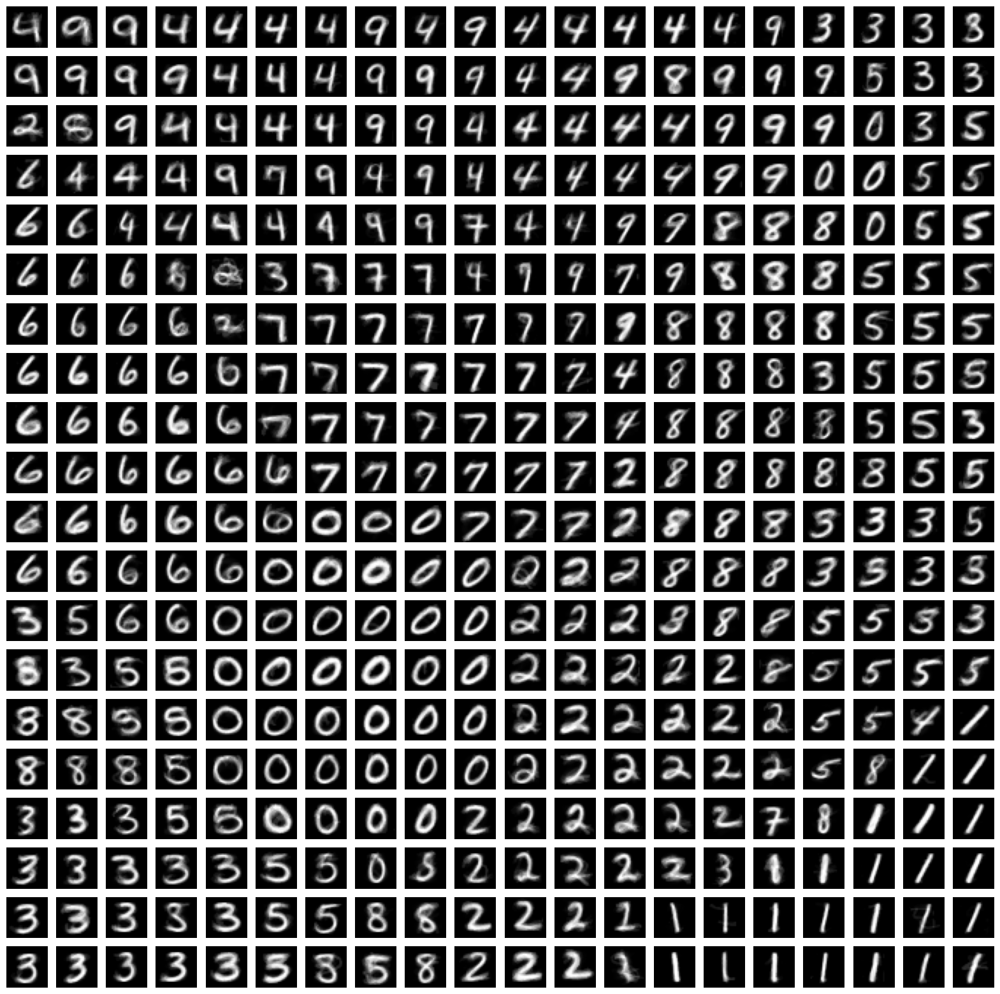

In [10]:
plot_som_centroids(som, som_size)

### SOM (ours, 3D lattice)

In [35]:
som_dim = 11
grid_x = np.linspace(-1, 1, som_dim)
grid_y = np.linspace(-1, 1, som_dim)
grid_z = np.linspace(-1, 1, som_dim)

grid_xs, grid_ys, grid_zs = np.meshgrid(grid_x, grid_y, grid_z)

grid_xs = grid_xs + .1 * np.random.randn(*grid_xs.shape) * 0.01
grid_ys = grid_ys + .1 * np.random.randn(*grid_ys.shape) * 0.01
grid_zs = grid_zs + .1 * np.random.randn(*grid_zs.shape) * 0.01

In [36]:
grid_xs.shape

(11, 11, 11)

In [37]:
density_sample = np.vstack((grid_xs.flatten(), grid_ys.flatten(), grid_zs.flatten())).T
density_sample.shape

(1331, 3)

In [38]:
class DensitySOM3D:
    def __init__(self, density_sample, learning_rate_initial = 0.1):
        """
        Initialize the Kohonen class.

                Parameters:
                density_sample (numpy.ndarray): The density sample used for training.

                Attributes:
                density_sample (numpy.ndarray): The density sample used for training.
                som_size (int): The size of the self-organizing map.
                som_centroids (None): The centroids of the self-organizing map.
                learning_rate_initial (float): The initial learning rate.
        """
        self.density_sample = density_sample # lattice
        self.som_size = self.density_sample.shape[0]
        # self.som_locations = None # not used??????
        self.som_centroids = None # "weights"
        # self.learning_rate_initial = learning_rate_initial

    def fit(self, X, iterations, sigma_initial, learning_rate_initial):
        if self.som_centroids is None:
            self.som_centroids = X[np.random.choice(X.shape[0], self.som_size, replace=False)]

        for iteration in range(iterations):
            print(f'\rIteration {iteration}/{iterations - 1}', end='')
            learning_rate = learning_rate_initial * np.exp(-iteration / iterations)
            sigma = sigma_initial * np.exp(-iteration / iterations)

            # Choose a random sample from the data
            sample = X[np.random.randint(X.shape[0])]

            # Find the winning neuron (the one closest to the sample)
            distances = np.linalg.norm(self.som_centroids - sample, axis=-1)
            winning_position = np.argmin(distances, axis=None)

            # Update the SOM weights
            distance_to_winner = np.linalg.norm(self.density_sample - self.density_sample[winning_position], axis=-1, keepdims=True)
            weight_update = np.exp(-(distance_to_winner**2) / (2 * sigma**2))
            self.som_centroids += learning_rate * weight_update * (sample - self.som_centroids)

In [39]:
densitySOM3D = DensitySOM3D(density_sample)

In [40]:
# nepoch = 3
nepoch = 5
for epoch in range(nepoch):
# for epoch in range(3):
    print("\n" if epoch != 0 else "" + f'Epoch {epoch}/{nepoch}')
    densitySOM3D.fit(X_mnist, iterations=10000, sigma_initial=1, learning_rate_initial=0.1)
    # cannot plot this yet
    # densitySOM3D.plot_SOM_grid(X_mnist)
    # print(f'Epoch {epoch}/100', end='')

Epoch 0/5
Iteration 9999/9999

Iteration 9999/9999

Iteration 9999/9999

Iteration 9999/9999

Iteration 9999/9999

### SOM (ours, 4D)

In [62]:
som_dim = 6
ndim = 4

grid_x = np.linspace(-1, 1, som_dim)
grid_y = np.linspace(-1, 1, som_dim)
grid_z = np.linspace(-1, 1, som_dim)
grid_d = np.linspace(-1, 1, som_dim)

grid_xs, grid_ys, grid_zs, grid_ds = np.meshgrid(grid_x, grid_y, grid_z, grid_d)

grid_xs = grid_xs + .1 * np.random.randn(*grid_xs.shape) * 0.01
grid_ys = grid_ys + .1 * np.random.randn(*grid_ys.shape) * 0.01
grid_zs = grid_zs + .1 * np.random.randn(*grid_zs.shape) * 0.01
grid_ds = grid_zs + .1 * np.random.randn(*grid_zs.shape) * 0.01

del grid_x
del grid_y
del grid_z
del grid_d

In [64]:
grid_xs.shape

(6, 6, 6, 6)

In [91]:
density_sample = np.vstack((grid_xs.flatten(), grid_ys.flatten(), grid_zs.flatten(), grid_ds.flatten())).T
density_sample.shape

(1296, 4)

In [92]:
# no changes to add 4th dim as of now
class DensitySOM4D:
    def __init__(self, density_sample, learning_rate_initial = 0.1):
        """
        Initialize the Kohonen class.

                Parameters:
                density_sample (numpy.ndarray): The density sample used for training.

                Attributes:
                density_sample (numpy.ndarray): The density sample used for training.
                som_size (int): The size of the self-organizing map.
                som_centroids (None): The centroids of the self-organizing map.
                learning_rate_initial (float): The initial learning rate.
        """
        self.density_sample = density_sample # lattice
        self.som_size = self.density_sample.shape[0]
        # self.som_locations = None # not used??????
        self.som_centroids = None # "weights"
        # self.learning_rate_initial = learning_rate_initial

    def fit(self, X, iterations, sigma_initial, learning_rate_initial):
        if self.som_centroids is None:
            self.som_centroids = X[np.random.choice(X.shape[0], self.som_size, replace=False)]

        for iteration in range(iterations):
            print(f'\rIteration {iteration}/{iterations - 1}', end='')
            learning_rate = learning_rate_initial * np.exp(-iteration / iterations)
            sigma = sigma_initial * np.exp(-iteration / iterations)

            # Choose a random sample from the data
            sample = X[np.random.randint(X.shape[0])]

            # Find the winning neuron (the one closest to the sample)
            distances = np.linalg.norm(self.som_centroids - sample, axis=-1)
            winning_position = np.argmin(distances, axis=None)

            # Update the SOM weights
            distance_to_winner = np.linalg.norm(self.density_sample - self.density_sample[winning_position], axis=-1, keepdims=True)
            weight_update = np.exp(-(distance_to_winner**2) / (2 * sigma**2))
            self.som_centroids += learning_rate * weight_update * (sample - self.som_centroids)

In [93]:
densitySOM4D = DensitySOM4D(density_sample)

In [94]:
# nepoch = 3
nepoch = 5
for epoch in range(nepoch):
# for epoch in range(3):
    print("\n" if epoch != 0 else "" + f'Epoch {epoch}/{nepoch}')
    densitySOM4D.fit(X_mnist, iterations=10000, sigma_initial=1, learning_rate_initial=0.1)
    # cannot plot this yet
    # densitySOM3D.plot_SOM_grid(X_mnist)
    # print(f'Epoch {epoch}/100', end='')

Epoch 0/5
Iteration 9999/9999

Iteration 9999/9999

Iteration 9999/9999

Iteration 9999/9999

Iteration 9999/9999

# learning inverse function

### SOM (miniSOM lib, 2d lattice)

In [24]:
from sklearn.neighbors import NearestNeighbors

som_size = 20  # 20x20 grid

def round_centroids(som, som_size, X_mnist):
    nn = NearestNeighbors(n_neighbors=1)
    nn.fit(X_mnist)

    round_centroids = np.zeros((som_size, som_size, 28, 28))
    for i in range(som_size):
        for j in range(som_size):
            centroid = som.get_weights()[i, j].reshape(1, -1)
            _, idx = nn.kneighbors(centroid, 1)
            
            round_centroids[i,j] = X_mnist[idx,:].reshape(28,28)
    return round_centroids


In [25]:
rounded_centroids = round_centroids(som, som_size, X_mnist)

Poniżej: $X \in \mathbb{R}^2$, natomiast $Y\in \mathbb{R}^{784}$. $x_i$ to pozycja $i$-tego centroidu w topologii mapy Kohonena, natomiast $y_i$ to nie jest sama surowa pozycja tego centroidu w $\mathbb{R}^{784}$, tylko $y_i$ to jest najbliższy centroidowi prawdziwy obrazek. Dzięki temu model uczy się na obrazkach z ostrzejszym detalem.

In [26]:
X = np.zeros((som_size**2, 2))
Y = np.zeros((som_size**2, 784))

for i in range(som_size):
    for j in range(som_size):
        X[i*som_size+j,:] = np.array([i, j])
        Y[i*som_size+j,:] = rounded_centroids[i,j].reshape(1, -1)

In [27]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from xgboost import XGBRegressor

model = make_pipeline(PolynomialFeatures(2), XGBRegressor())
model.fit(X, Y)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('xgbregressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [28]:
X

array([[ 0.,  0.],
       [ 0.,  1.],
       [ 0.,  2.],
       [ 0.,  3.],
       [ 0.,  4.],
       [ 0.,  5.],
       [ 0.,  6.],
       [ 0.,  7.],
       [ 0.,  8.],
       [ 0.,  9.],
       [ 0., 10.],
       [ 0., 11.],
       [ 0., 12.],
       [ 0., 13.],
       [ 0., 14.],
       [ 0., 15.],
       [ 0., 16.],
       [ 0., 17.],
       [ 0., 18.],
       [ 0., 19.],
       [ 1.,  0.],
       [ 1.,  1.],
       [ 1.,  2.],
       [ 1.,  3.],
       [ 1.,  4.],
       [ 1.,  5.],
       [ 1.,  6.],
       [ 1.,  7.],
       [ 1.,  8.],
       [ 1.,  9.],
       [ 1., 10.],
       [ 1., 11.],
       [ 1., 12.],
       [ 1., 13.],
       [ 1., 14.],
       [ 1., 15.],
       [ 1., 16.],
       [ 1., 17.],
       [ 1., 18.],
       [ 1., 19.],
       [ 2.,  0.],
       [ 2.,  1.],
       [ 2.,  2.],
       [ 2.,  3.],
       [ 2.,  4.],
       [ 2.,  5.],
       [ 2.,  6.],
       [ 2.,  7.],
       [ 2.,  8.],
       [ 2.,  9.],
       [ 2., 10.],
       [ 2., 11.],
       [ 2.,

In [29]:
def plot_generation(model, rounded_centroids):
    som_size = rounded_centroids.shape[0]
    plt.figure(figsize=(som_size, som_size))
    for i in range(som_size):
        for j in range(som_size):
            x = np.array([[i, j]]) + np.random.uniform(low=-0.5, high=0.5, size=(2))           
            plt.subplot(som_size, som_size, i*som_size+j+1)
            plt.imshow(model.predict(x).reshape(28,28), cmap='gray')
            plt.axis('off')
    plt.show()

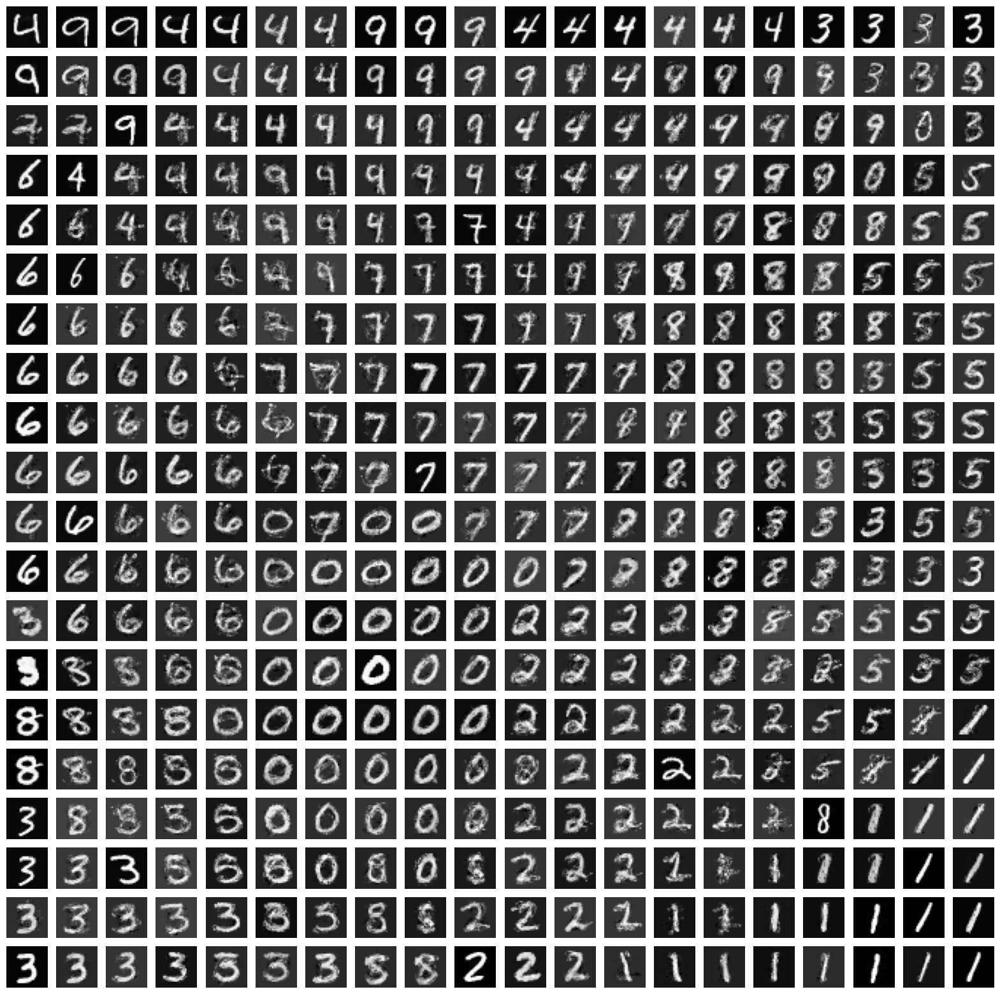

In [30]:
plot_generation(model, rounded_centroids)

### SOM (ours, 3D)

In [41]:
som_dim = 11 # 11 x 11 x 11 grid

In [42]:
from sklearn.neighbors import NearestNeighbors

def round_centroids(som, som_dim, X_mnist):
    nn = NearestNeighbors(n_neighbors=1)
    nn.fit(X_mnist)

    round_centroids = np.zeros((som_dim, som_dim, som_dim, 28, 28))
    for i in range(0, som_dim):
        for j in range(0, som_dim):
            for k in range(0, som_dim):
                centroid = som.som_centroids[i * som_dim * som_dim + j * som_dim + k].reshape(1, -1)
                _, idx = nn.kneighbors(centroid, 1)
                
                round_centroids[i,j,k] = X_mnist[idx,:].reshape(28,28) # Reshape weights to 28x28 (MNIST images size)
    return round_centroids


In [43]:
rounded_centroids = round_centroids(densitySOM3D, som_dim, X_mnist)

In [44]:
rounded_centroids.shape

(11, 11, 11, 28, 28)

In [45]:
X_mnist.shape

(70000, 784)

In [46]:
som_dim

11

In [47]:
import plotly.graph_objects as go
import numpy as np
from PIL import Image

# image_path = 'path_to_your_image.jpg'
# image = Image.open(image_path)

# # Convert the image to a numpy array
# image_array = np.array(image)

# # Create a Plotly figure
fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='markers',
#                                    marker=dict(size=2, color='blue'))])

# # Add the image as a surface plot
for i in range(0, som_dim, 3): # limit the plot size
  for j in range(0, som_dim, 3): # limit the plot size
    for k in range(0, som_dim, 3): # limit the plot size
  
      img = rounded_centroids[i,j,k].reshape(28,28)
      # img = np.ones_like(X_mnist[0].reshape(28,28))
      fig.add_surface(x=np.linspace(i, i+0.5, num=28), y=np.linspace(j, j+0.5, num=28), z=np.full_like(img, k), surfacecolor=img,
                      colorscale='gray', showscale=False, opacity = 0.7)

# fig.add_layout_image

# Update layout for a better view
fig.update_layout(title="\"Rounded centroids\" of 3D MNIST SOM lattice",
                  scene=dict(
                      # xaxis_title='X Axis',
                      # yaxis_title='Y Axis',
                      # zaxis_title='Z Axis'
                  ))

# Show the plot
fig.show()


**Most likely the exciting 3D plot of 3D SOM embedding space above won't render in the GitHub notebook preview /:**

Poniżej: $X \in \mathbb{R}^2$, natomiast $Y\in \mathbb{R}^{784}$. $x_i$ to pozycja $i$-tego centroidu w topologii mapy Kohonena, natomiast $y_i$ to nie jest sama surowa pozycja tego centroidu w $\mathbb{R}^{784}$, tylko $y_i$ to jest najbliższy centroidowi prawdziwy obrazek. Dzięki temu model uczy się na obrazkach z ostrzejszym detalem.

In [48]:
X = np.zeros((som_dim**3, 3))
Y = np.zeros((som_dim**3, 784))

for i in range(som_dim):
    for j in range(som_dim):
        for k in range(som_dim):
            X[i*som_dim*som_dim + j * som_dim + k,:] = np.array([i, j, k])
            Y[i*som_dim*som_dim + j * som_dim + k,:] = rounded_centroids[i,j, k].reshape(1, -1)

In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from xgboost import XGBRegressor

model = make_pipeline(PolynomialFeatures(2), XGBRegressor())
model.fit(X, Y)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('xgbregressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [50]:
X.shape

(1331, 3)

In [51]:
def plot_generation(model, rounded_centroids):
    som_dim = rounded_centroids.shape[0]
    plt.figure(figsize=(som_dim, som_dim*som_dim))
    for i in range(som_dim):
        for j in range(som_dim):
            for k in range(som_dim):
                x = np.array([[i, j, k]]) + np.random.uniform(low=-0.5, high=0.5, size=(3))           
                plt.subplot(som_dim * som_dim, som_dim, i*som_dim*som_dim+j*som_dim + k+1)
                plt.imshow(model.predict(x).reshape(28,28), cmap='gray')
                plt.axis('off')
    plt.show()

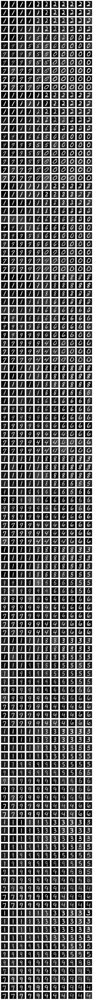

In [52]:
plot_generation(model, rounded_centroids)

### SOM (ours, 4D)

In [95]:
som_dim = 6 # 6 x 6 x 6 grid

In [96]:
from sklearn.neighbors import NearestNeighbors

def round_centroids(som, som_dim, X_mnist):
    nn = NearestNeighbors(n_neighbors=1)
    nn.fit(X_mnist)

    round_centroids = np.zeros((som_dim, som_dim, som_dim, som_dim, 28, 28))
    for i in range(0, som_dim):
        for j in range(0, som_dim):
            for k in range(0, som_dim):
              for l in range(0, som_dim):
                centroid = som.som_centroids[i * som_dim * som_dim * som_dim + j * som_dim * som_dim + k * som_dim + l].reshape(1, -1)
                _, idx = nn.kneighbors(centroid, 1)
                
                round_centroids[i,j,k,l] = X_mnist[idx,:].reshape(28,28) # Reshape weights to 28x28 (MNIST images size)
    return round_centroids


In [97]:
rounded_centroids = round_centroids(densitySOM4D, som_dim, X_mnist)

In [98]:
rounded_centroids.shape

(6, 6, 6, 6, 28, 28)

In [99]:
X_mnist.shape

(70000, 784)

In [100]:
som_dim

6

In [101]:
X = np.zeros((som_dim**ndim, ndim))
Y = np.zeros((som_dim**ndim, 784))

for i in range(som_dim):
    for j in range(som_dim):
        for k in range(som_dim):
            for l in range(som_dim):
                X[i*som_dim*som_dim*som_dim + j * som_dim*som_dim + k*som_dim + l,:] = np.array([i, j, k, l])
                Y[i*som_dim*som_dim*som_dim + j * som_dim*som_dim + k*som_dim + l,:] = rounded_centroids[i,j,k,l].reshape(1, -1)

In [102]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from xgboost import XGBRegressor

model = make_pipeline(PolynomialFeatures(2), XGBRegressor())
model.fit(X, Y)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('xgbregressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [103]:
X.shape

(1296, 4)

In [106]:
def plot_generation(model, rounded_centroids):
    som_dim = rounded_centroids.shape[0]
    plt.figure(figsize=(som_dim, som_dim*som_dim*som_dim))
    for i in range(som_dim):
        for j in range(som_dim):
            for k in range(som_dim):
                for l in range(som_dim):
                    x = np.array([[i, j, k, l]]) + np.random.uniform(low=-0.5, high=0.5, size=(ndim))           
                    plt.subplot(som_dim * som_dim * som_dim, som_dim, i*som_dim*som_dim*som_dim+j*som_dim*som_dim + k*som_dim + l+1)
                    plt.imshow(model.predict(x).reshape(28,28), cmap='gray')
                    plt.axis('off')
    plt.show()

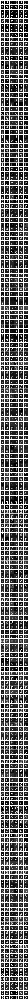

In [107]:
plot_generation(model, rounded_centroids)

## jak ocenić jakość generacji?

Użyjmy kolejnego klasyfikatora do oceny jakości generowania. Stwórzmy dataset złożony z oryginalnych obrazków i złożony z takiej samej ilości obrazków wygenerowanych przez nas. Labele y mówią 1, gdy prawdziwy, a 0, gdy fejk.
Intuicja:
- jeśli obrazki są słabe, to k-NN będzie miał 100% accuracy przy klasyfikacji
- jeśli obrazki są idealnie wierne oryginałom, to accuracy będzie bardzo niskie

Zadanie do pomyślenia:
- **czy w ogóle możliwe jest, aby 1-NN klasyfikator mógł mieć kiedykolwiek 0% accuracy? co dla 2-NN?**

### SOM 2D (miniSOM): removed, todo

### SOM 3D 11x11x11 (ours)

In [53]:
X_tru = Y
X_tru.shape

(1331, 784)

In [54]:
nsample = X_tru.shape[0]
ndim = 3
data_uniform = np.random.uniform(0, som_dim, (nsample, ndim))
data_uniform.shape

(1331, 3)

In [55]:
data_uniform.shape

(1331, 3)

In [56]:
generated_images = []
for i, random_point in enumerate(data_uniform):
    generated_images.append(model.predict(random_point.reshape(1, -1)).reshape(-1))

X_gen = np.array(generated_images)

In [57]:
X_gen.shape

(1331, 784)

In [58]:
X = np.vstack([X_tru, X_gen])
y = np.array(X_tru.shape[0]*[1] + X_gen.shape[0]*[0])

In [59]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Split the dataset into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create kNN classifier. You can adjust the number of neighbors (n_neighbors)
knn = KNeighborsClassifier(n_neighbors=3)

# Train the classifier
knn.fit(X_train, y_train)

# Predict on the test set
y_pred = knn.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 66.83%


In [60]:
def plot_generated_images(generated_images):
    plt.figure(figsize=(som_size, som_size))
    for i in range(som_size):
        for j in range(som_size):           
            plt.subplot(som_size, som_size, i*som_size+j+1)
            plt.imshow(generated_images[i*som_size + j].reshape(28,28), cmap='gray')
            plt.axis('off')
    plt.show()

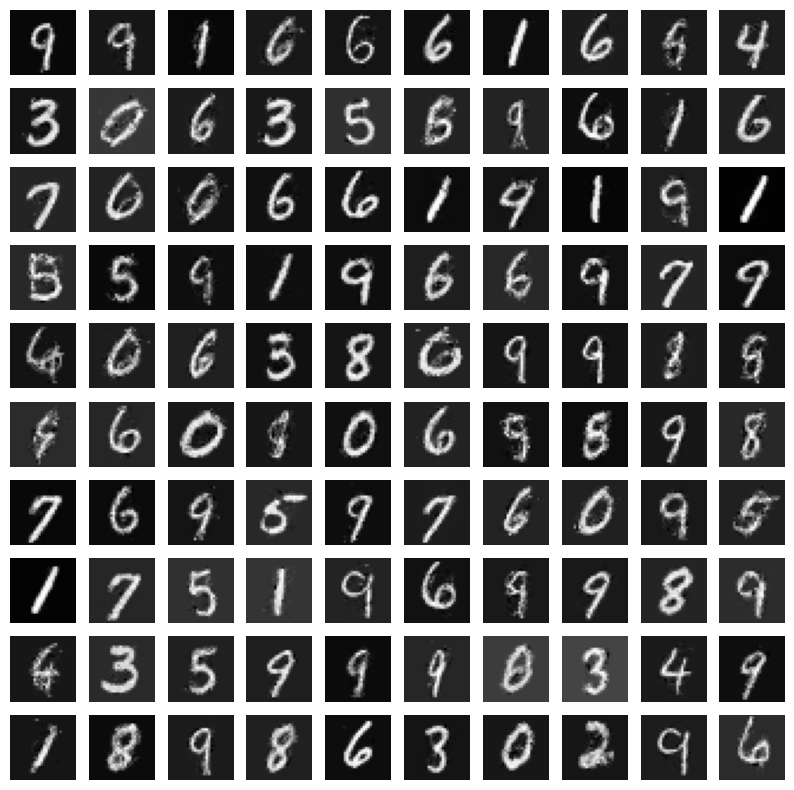

In [61]:
plot_generated_images(generated_images)

### SOM 4D 6x6x6x6 (ours)

In [108]:
X_tru = Y
X_tru.shape

(1296, 784)

In [109]:
nsample = X_tru.shape[0]
ndim = 4
data_uniform = np.random.uniform(0, som_dim, (nsample, ndim))
data_uniform.shape

(1296, 4)

In [110]:
data_uniform.shape

(1296, 4)

In [111]:
generated_images = []
for i, random_point in enumerate(data_uniform):
    generated_images.append(model.predict(random_point.reshape(1, -1)).reshape(-1))

X_gen = np.array(generated_images)

In [112]:
X_gen.shape

(1296, 784)

In [113]:
X = np.vstack([X_tru, X_gen])
y = np.array(X_tru.shape[0]*[1] + X_gen.shape[0]*[0])

In [114]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Split the dataset into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create kNN classifier. You can adjust the number of neighbors (n_neighbors)
knn = KNeighborsClassifier(n_neighbors=3)

# Train the classifier
knn.fit(X_train, y_train)

# Predict on the test set
y_pred = knn.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 84.06%


In [ ]:
def plot_generated_images(generated_images):
    plt.figure(figsize=(som_size, som_size))
    for i in range(som_size):
        for j in range(som_size):           
            plt.subplot(som_size, som_size, i*som_size+j+1)
            plt.imshow(generated_images[i*som_size + j].reshape(28,28), cmap='gray')
            plt.axis('off')
    plt.show()

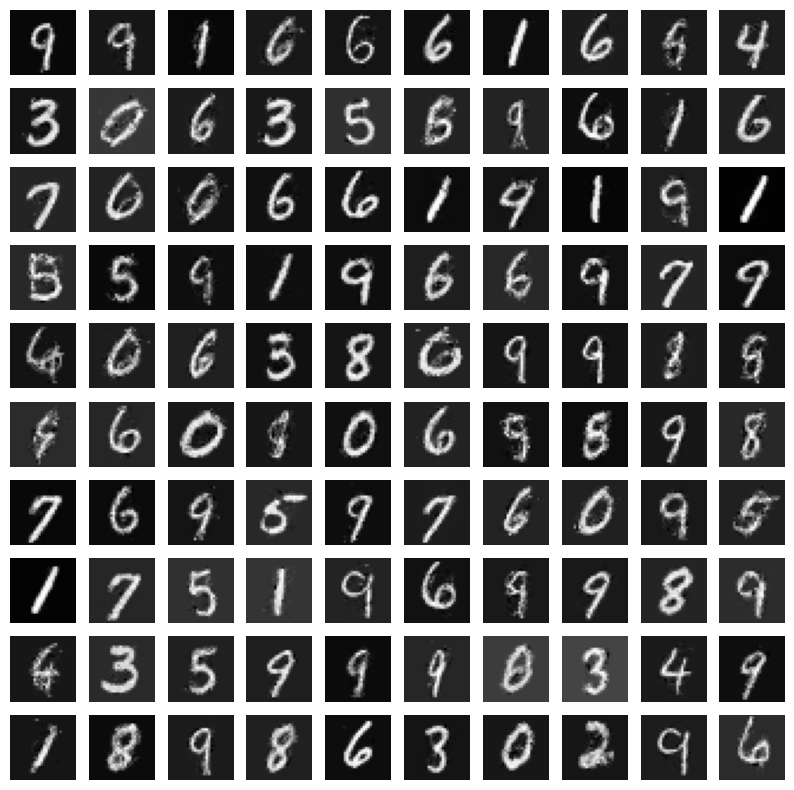

In [ ]:
plot_generated_images(generated_images)